<a href="https://colab.research.google.com/github/leoromanovich/DL_projects/blob/master/Style_transfer_PyTorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Simple style transfer on PyTorch (Old type of style transfering)

### This notebook  was written by me during the [PyTorch for Deep Learning and Computer Vision course](https://www.udemy.com/pytorch-for-deep-learning-and-computer-vision/).

In [0]:
!pip install torch torchvision
!pip install Pillow==4.0.0

     |████████████████████████████████| 2.1MB 3.4MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 4.0.0
    Uninstalling Pillow-4.0.0:
      Successfully uninstalled Pillow-4.0.0


  Using cached https://files.pythonhosted.org/packages/37/e8/b3fbf87b0188d22246678f8cd61e23e31caa1769ebc06f1664e2e5fe8a17/Pillow-4.0.0-cp36-cp36m-manylinux1_x86_64.whl
ERROR: torchvision 0.3.0 has requirement pillow>=4.1.1, but you'll have pillow 4.0.0 which is incompatible.
ERROR: scikit-image 0.15.0 has requirement pillow>=4.3.0, but you'll have pillow 4.0.0 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 6.1.0
    Uninstalling Pillow-6.1.0:
      Successfully uninstalled Pillow-6.1.0


In [0]:
%matplotlib inline 
import torch
import torch.optim as optim
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

In [0]:
vgg = models.vgg19(pretrained=True).features

for param in vgg.parameters():
    param.requires_grad_(False)

In [0]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace)
  (18): MaxPool2d(kernel_size=2, stride=2, padding=0, 

In [0]:
# import images to transfer

# def load_image(img_path, max_size=400, shape=None):
#     image = Image.open(img_path).convert('RGB')
#     if max(image.size) > max_size:
#         size = max_size
#     else:
#         size = max(image.size)
    
#     if shape is not None:
#         size = shape
    
#     in_transform = transforms.Compose([
#                         transforms.Resize(size),
#                         transforms.ToTensor(),
#                         transforms.Normalize((0.5, 0.5, 0.5),
#                                              (0.5, 0.5, 0.5))
#                     ])
#     image = in_transform(image).unsqueeze(0) # what is unsqueeze
    
#     return image

def load_image(img_path, max_size=400, shape=None):
    
    image = Image.open(img_path).convert('RGB')
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.5, 0.5, 0.5), 
                                             (0.5, 0.5, 0.5))])

    image = in_transform(image).unsqueeze(0)
    
    return image

In [0]:
    
import requests
import PIL
from PIL import Image
url = 'https://pp.userapi.com/c840627/v840627489/775f9/WIIh1Fa0Euc.jpg'
response = requests.get(url, stream=True)
content_image = Image.open(response.raw)
content_image.save('content.jpg')


url = 'http://n1s1.hsmedia.ru/7c/cb/f1/7ccbf1dc8039163054842cde0e54508b/680x372_1_a8f8051b93fa8f9f29b2a2687b0be9dd@690x378_0xc0a8392b_11519516841493219997.jpeg'
response = requests.get(url, stream=True)
style_image = Image.open(response.raw)
style_image.save('style.jpg')

In [0]:


content = load_image('content.jpg').to(device)
style = load_image('style.jpg', shape=content.shape[-2:]).to(device)

# content = load_image('City.jpg').to(device)
# style = load_image('StarryNight.jpg').to(device)

In [0]:
def im_convert(tensor):
    image = tensor.cpu().clone().detach().numpy()
    image = image.squeeze()
    image = image.transpose(1, 2, 0)
    image = image * np.array((0.5, 0.5, 0.5)) + np.array((0.5, 0.5, 0.5))
    image = image.clip(0, 1)
    return image

(-0.5, 598.5, 399.5, -0.5)

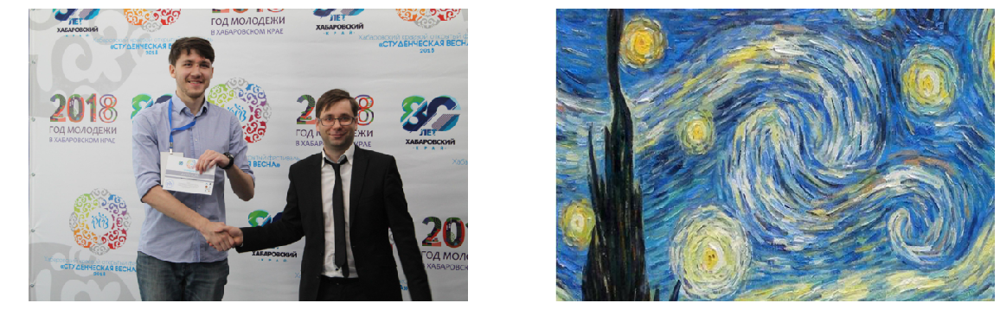

In [0]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(im_convert(content))
ax1.axis('off')
ax2.imshow(im_convert(style))
ax2.axis('off')

## What is style transfering: 

We can separate features of style and features of context.


In [0]:
# extract features
def get_features(image, model):
    layers = {'0': 'conv1_1',  # style extraction
              '5': 'conv2_1',  # style extraction
              '10': 'conv3_1', # style extraction
              '19': 'conv4_1', # style extraction
              '21': 'conv4_2', # content extraction
              '28': 'conv5_1', # style extraction
             }
    features = {}
    for name, layer in model._modules.items():
        image = layer(image) # feed image through the layers
        if name in layers:
            features[layers[name]] = image # add features and layer name into dictionary
            
    return features

In [0]:
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

In [0]:
# Gram matrix
# Elimination of content information from features

def gram_matrix(tensor):
    _ , depth, height, width = tensor.size() # where _ is batch_size
    tensor = tensor.view(depth, height*width)
#     print('Tensor shape: ', tensor.shape)
    gram = torch.mm(tensor, tensor.t())
#     print('Gram mx shape:', gram.shape)
    return gram

In [0]:
style_grams = {layer:gram_matrix(style_features[layer]) for layer in style_features}

In [0]:
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2,
                }
content_weight = 1
style_weight   = 1e6

In [0]:
target = content.clone().requires_grad_(True).to(device)

In [0]:
show_every = 300
optimizer = torch.optim.Adam([target], lr=0.003)
steps = 10000 # balance between time and style transfer 
height, width, channels = im_convert(target).shape
image_array = np.empty(shape=(300, height, width, channels))
capture_frame = steps/300
counter = 0

Total loss:  585425.1875
Iteration:  300


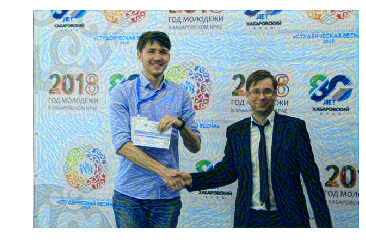

Total loss:  155951.671875
Iteration:  600


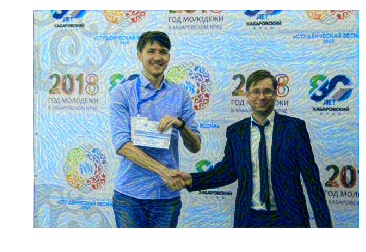

Total loss:  108563.9609375
Iteration:  900


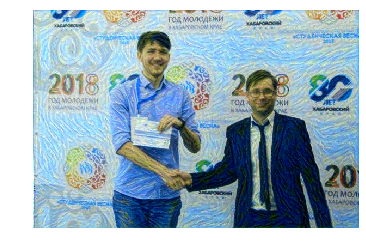

Total loss:  83989.7265625
Iteration:  1200


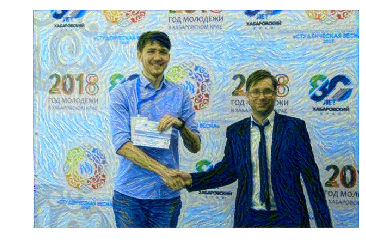

Total loss:  68548.2734375
Iteration:  1500


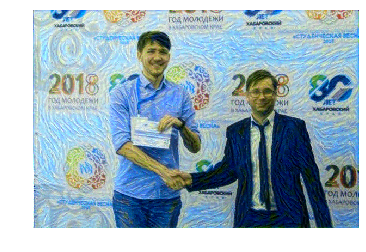

Total loss:  57770.0390625
Iteration:  1800


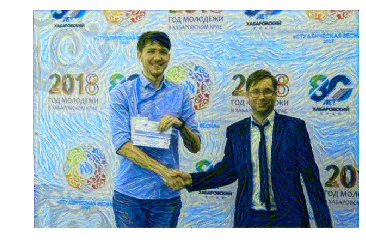

Total loss:  49593.66796875
Iteration:  2100


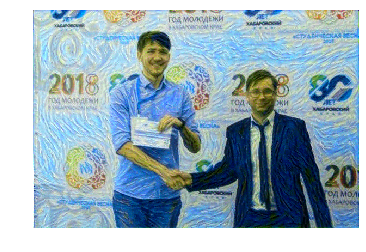

Total loss:  43074.51953125
Iteration:  2400


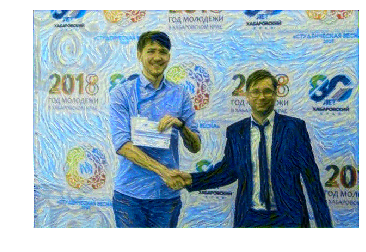

Total loss:  37699.3359375
Iteration:  2700


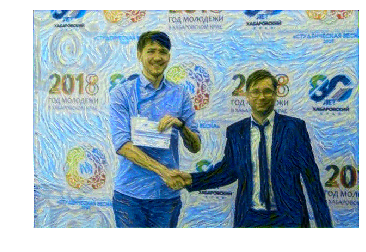

Total loss:  33115.1171875
Iteration:  3000


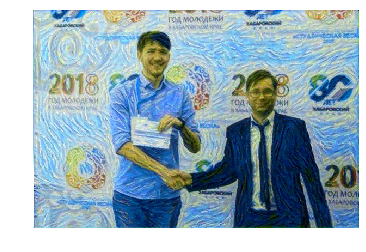

Total loss:  29138.1640625
Iteration:  3300


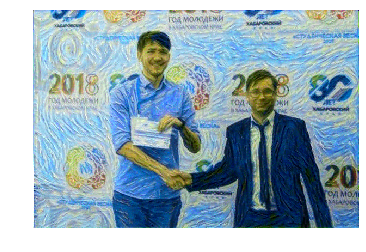

Total loss:  25638.046875
Iteration:  3600


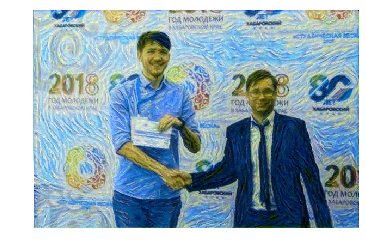

Total loss:  22540.294921875
Iteration:  3900


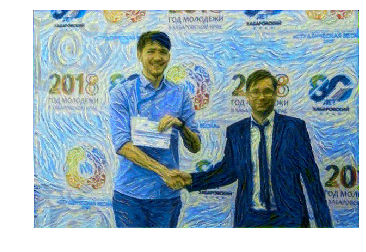

Total loss:  19799.021484375
Iteration:  4200


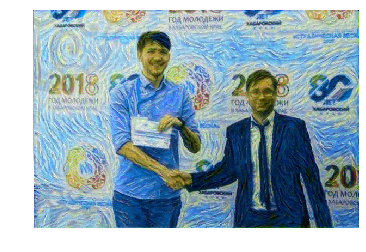

Total loss:  17385.2109375
Iteration:  4500


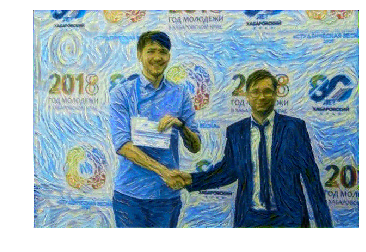

Total loss:  15263.517578125
Iteration:  4800


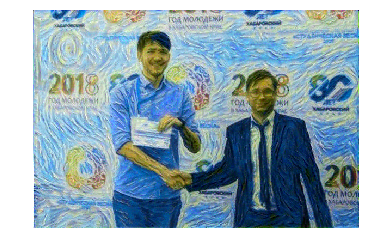

Total loss:  13414.2412109375
Iteration:  5100


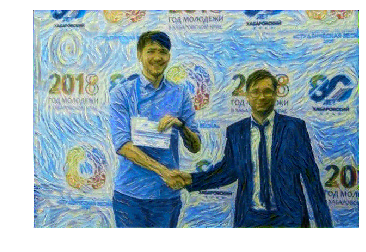

Total loss:  11827.482421875
Iteration:  5400


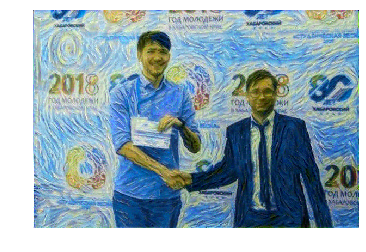

Total loss:  10503.9599609375
Iteration:  5700


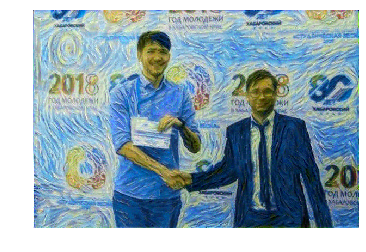

Total loss:  9388.8349609375
Iteration:  6000


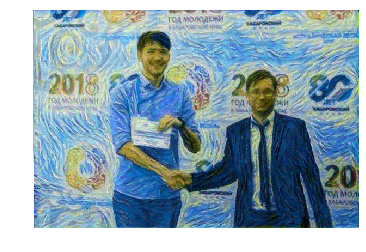

Total loss:  8512.876953125
Iteration:  6300


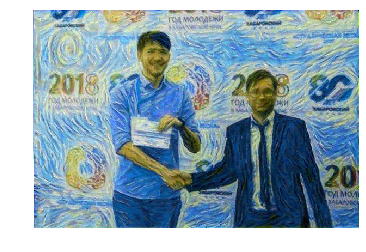

Total loss:  8299.7138671875
Iteration:  6600


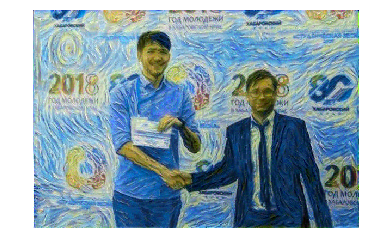

Total loss:  7221.62451171875
Iteration:  6900


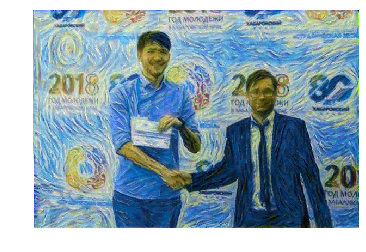

Total loss:  6697.64990234375
Iteration:  7200


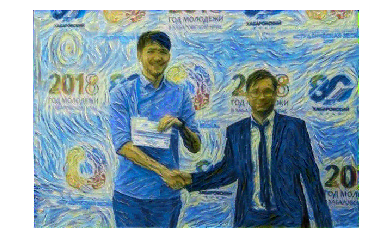

Total loss:  6249.8349609375
Iteration:  7500


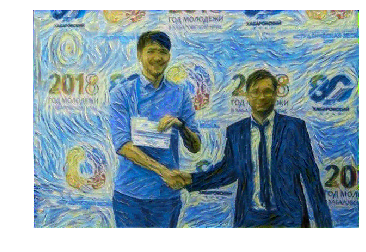

Total loss:  5886.35302734375
Iteration:  7800


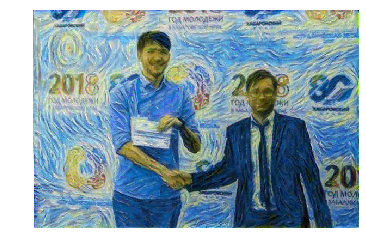

Total loss:  5997.9970703125
Iteration:  8100


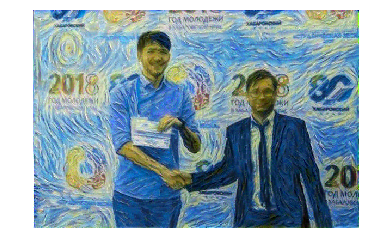

Total loss:  5336.51416015625
Iteration:  8400


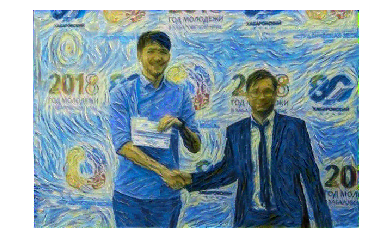

Total loss:  5132.94140625
Iteration:  8700


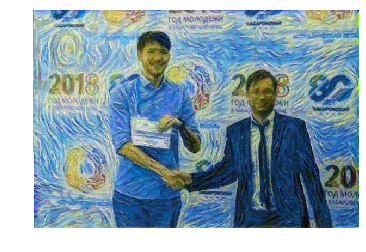

Total loss:  5007.5693359375
Iteration:  9000


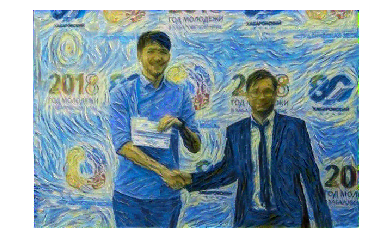

Total loss:  4732.81884765625
Iteration:  9300


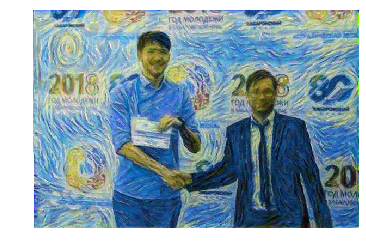

Total loss:  4575.2666015625
Iteration:  9600


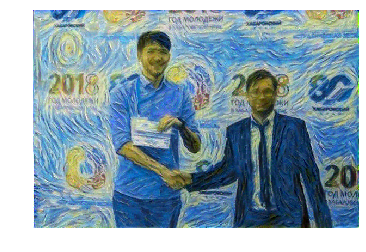

Total loss:  4516.9306640625
Iteration:  9900


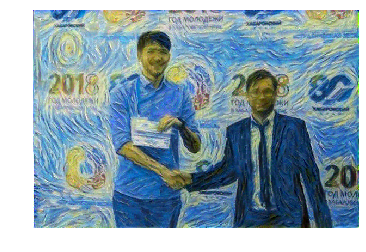

In [0]:
for ii in range(1, steps+1):
    target_features = get_features(target, vgg)
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        style_gram = style_grams[layer]
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        _, d, h, w = target_feature.shape
        style_loss += layer_style_loss / (d * h * w)
        
    total_loss = content_loss * content_weight + style_loss * style_weight
    
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    if ii % show_every == 0:
        print("Total loss: ", total_loss.item())
        print("Iteration: ", ii)
        plt.imshow(im_convert(target))
        plt.axis('off')
        plt.show()
    if ii % capture_frame == 0:
        image_array[counter] = im_convert(target)
        counter += 1
    
        
        

(-0.5, 598.5, 399.5, -0.5)

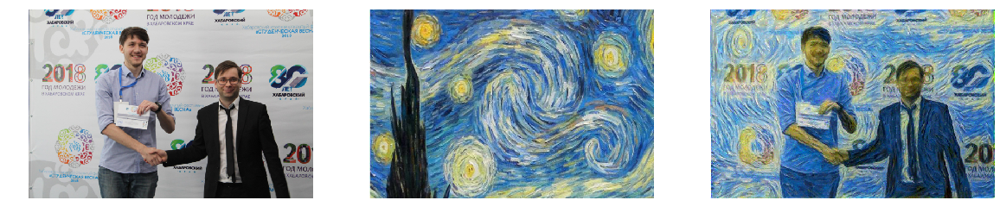

In [0]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax1.axis('off')
ax2.imshow(im_convert(style))
ax2.axis('off')
ax3.imshow(im_convert(target))
ax3.axis('off')

In [0]:
import cv2

frame_height, frame_width, _ = im_convert(target).shape
vid = cv2.VideoWriter('output.mp4', cv2.VideoWriter_fourcc(*'XVID'), 30, (frame_width, frame_height))

for i in range(0, 300):
    img = image_array[i]
    img = img * 255
    img = np.array(img, dtype=np.uint8)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    vid.write(img)
    
vid.release()

In [0]:
!ls

City.jpg  Me.jpg  MonaLisa.jpg	output.mp4  sample_data  StarryNight.jpg


In [0]:
from google.colab import files
files.download('output.mp4')